# Predictor de ventas del area Cosmetica por sectores para Stanhome

*Este proyecto se realiza bajo la solicitud del departamento de Marketing, quienes luego de ver la disminución de ventas del área de Beauty (cosmética), han solicitado la verificación de ventas de sus productos estrellas y la repercusión de las ofertas.*

# Hipótesis 
El tipo de oferta influye sobre la decisión de compra de acuerdo a la zona del país. 

# Variables
*Variable Dependiente (efecto):* 
- PVP producto 
- Unidades vendidas

*Variable Independiente (causa):* 
- Promociones
- Zona de residencia del comprador

*Variable interviniente:* 
- Fecha de venta 
- Localización en el catalogo 
- Tipología de cliente (Consejera, VIP_client)

# Carga de las Librerias

In [46]:
import sys, os
current_path = os.getcwd()
src_path = os.path.dirname(current_path)
root_path = os.path.dirname(src_path)
def get_root_path(n):
    '''
    Esta función nos permite iterar sobre carpetas para añadir el path de nuestra carpeta raíz
    Argumentos:
        - n (int): el número de veces que iteraremos para llegar a la carpeta deseada
    '''
    path = os.getcwd() # para notebook ||| __file__ --> para .py
    for i in range(n):
        path = os.path.dirname(path)
    print(path)
    sys.path.append(path)

get_root_path(n=2)
sys.path

/Users/richart_jennifer/Library/Mobile Documents/com~apple~CloudDocs/Data Science/Bootcamp/EDA ML


['/Users/richart_jennifer/Library/Mobile Documents/com~apple~CloudDocs/Data Science/Bootcamp/EDA ML/src/notebooks',
 '/Users/richart_jennifer/.vscode/extensions/ms-toolsai.jupyter-2021.8.2041215044/pythonFiles',
 '/Users/richart_jennifer/.vscode/extensions/ms-toolsai.jupyter-2021.8.2041215044/pythonFiles/lib/python',
 '/Library/Frameworks/Python.framework/Versions/3.7/lib/python37.zip',
 '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7',
 '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/lib-dynload',
 '',
 '/Users/richart_jennifer/Library/Python/3.7/lib/python/site-packages',
 '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages',
 '/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/extensions',
 '/Users/richart_jennifer/.ipython',
 '/Users/richart_jennifer/Library/Mobile Documents/com~apple~CloudDocs/Data Science/Bootcamp/EDA ML',
 '/Users/richart_jennifer/Library/Mobile Documents/com~apple~Cl

In [47]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
import phik
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, r2_score
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn import preprocessing, metrics, linear_model, model_selection
from sklearn.tree import DecisionTreeRegressor, plot_tree
from scipy.stats import shapiro, skew, iqr
from scipy import stats
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import load_boston
from sklearn.feature_selection import SelectKBest
import statsmodels as sm
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from src.utils.funciones import * 
import sys, os
%matplotlib inline

# Cargamos los datos

In [48]:
df_1 = pd.read_excel("../data/processed/df_1.xlsx", index_col = 0)
df_2 = pd.read_excel("../data/processed/df_2.xlsx", index_col = 0)


In [40]:
df_1 = df_1[['REGION_ID','CICLO', 'YEAR', 'MONTH',
       'DATE', 'ID_STANHOME', '%DTO.', 'PAGINA',
       'COD-MOV.', 'SEGMENTO_ID', 'PVP','PVP_TOT_FACTURA', 'PROMO_ID']]

In [9]:
df_1.head(2)

,REGION_ID,CICLO,YEAR,MONTH,DATE,ID_STANHOME,%DTO.,PAGINA,COD-MOV.,SEGMENTO_ID,PVP,PVP_TOT_FACTURA,PROMO_ID
0,2,201801,2018,4,1970-01-01,74214,25.0,10,2200,0,44.9,272.14,4
2,4,201801,2018,4,1970-01-01,25322,30.0,10,2200,0,44.9,370.40,4


In [16]:
df_1.describe()

,REGION_ID,CICLO,YEAR,MONTH,DAY,ID_STANHOME,ITEM_ID,ARTICULO,%DTO.,PAGINA,COD-MOV.,SEGMENTO_ID,PVP,PVP_TOT_FACTURA,PROMO_ID
count,2245.000000,2245.000000,2245.000000,2245.0,2245.0,2245.000000,2245.0,2245.0,2245.000000,2245.000000,2245.00000,2245.0,2245.000000,2245.000000,2245.000000
mean,2.795991,202061.053007,2020.488641,4.0,1.0,51997.543875,3.0,9185.0,23.903519,358.923385,2211.14922,1.0,36.544704,202.058316,3.927394
std,1.401006,46.580976,0.499982,0.0,0.0,29919.060181,0.0,0.0,9.855287,282.929665,22.93946,0.0,13.786395,143.371926,0.259546
min,1.000000,202014.000000,2020.000000,4.0,1.0,93.000000,3.0,9185.0,0.000000,9.000000,2200.00000,1.0,16.650000,29.950000,3.000000
25%,1.000000,202016.000000,2020.000000,4.0,1.0,23702.000000,3.0,9185.0,20.000000,33.000000,2200.00000,1.0,29.950000,106.800000,4.000000
50%,3.000000,202018.000000,2020.000000,4.0,1.0,53601.000000,3.0,9185.0,25.000000,553.000000,2210.00000,1.0,30.000000,170.300000,4.000000
75%,4.000000,202108.000000,2021.000000,4.0,1.0,80477.000000,3.0,9185.0,30.000000,600.000000,2210.00000,1.0,39.950000,242.760000,4.000000
max,5.000000,202117.000000,2021.000000,4.0,1.0,99380.000000,3.0,9185.0,52.000000,832.000000,2290.00000,1.0,59.990000,1665.500000,4.000000


In [12]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16582 entries, 0 to 43037
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   REGION_ID        16582 non-null  int64         
 1   CICLO            16582 non-null  int64         
 2   YEAR             16582 non-null  int64         
 3   MONTH            16582 non-null  int64         
 4   DATE             16582 non-null  datetime64[ns]
 5   ID_STANHOME      16582 non-null  int64         
 6   %DTO.            16582 non-null  float64       
 7   PAGINA           16582 non-null  int64         
 8   COD-MOV.         16582 non-null  int64         
 9   SEGMENTO_ID      16582 non-null  int64         
 10  PVP              16582 non-null  float64       
 11  PVP_TOT_FACTURA  16582 non-null  float64       
 12  PROMO_ID         16582 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(9)
memory usage: 1.8 MB


In [32]:
data_report(df_1)

COL_N,CICLO,SEMANA (SST),YEAR,MONTH,DAY,DATE,#_FACTURA,ID_STANHOME,ITEM_ID,ARTICULO,PICK,%DTO.,PAGINA,COD-MOV.,AMBITO,PVP.ART.,PVP,Q.FACTURADA,PVP_TOT_FACTURA,PROMO_ID
DATA_TYPE,float64,float64,float64,object,float64,object,float64,float64,int64,float64,float64,float64,float64,float64,object,float64,float64,float64,float64,int64
MISSINGS (%),0.03,0.03,0.03,0.03,24.23,0.03,0.03,0.03,0.0,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.38,0.03,0.03,0.0
UNIQUE_VALUES,69,190,4,19,1,69,38525,10125,4,4,36,17,94,5,3,405,67,36,18919,3
CARDIN (%),0.16,0.44,0.01,0.04,0.0,0.16,89.18,23.44,0.01,0.01,0.08,0.04,0.22,0.01,0.01,0.94,0.16,0.08,43.79,0.01


# Realizamos algunas visualizaciones

In [25]:
df_1.profile_report()

Render HTML: 100%|██████████| 1/1 [00:08<00:00,  8.82s/it]


## Verificamos la variable tiempo

<AxesSubplot:>

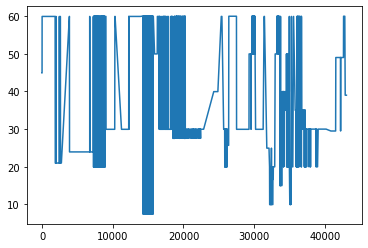

In [10]:
df_1["PVP"].plot()

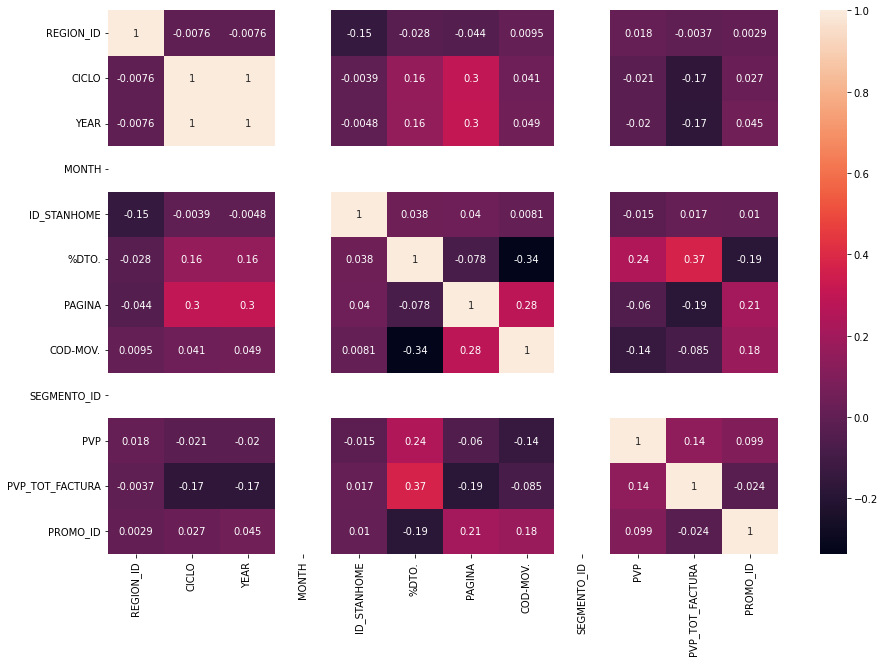

In [17]:
plt.figure(figsize=(15,10))
sns.heatmap(df_1.corr(), annot=True)
plt.show();

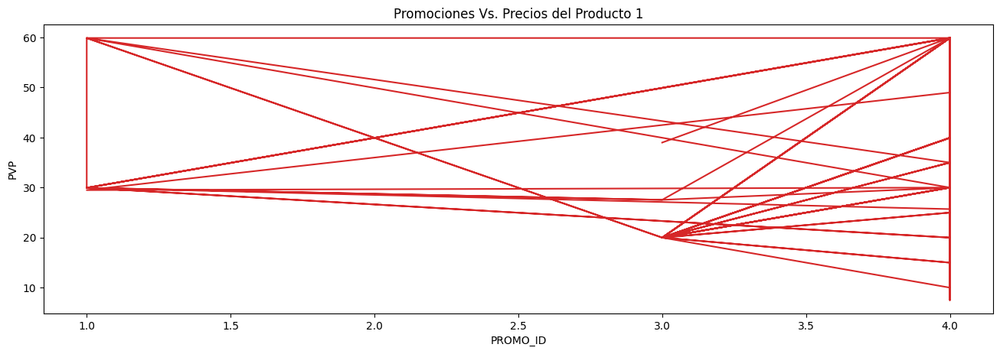

In [18]:
plot_df(df_1, x=df_1.PROMO_ID, y=df_1.PVP, title='Promociones Vs. Precios del Producto 1', xlabel='PROMO_ID', ylabel='PVP') 

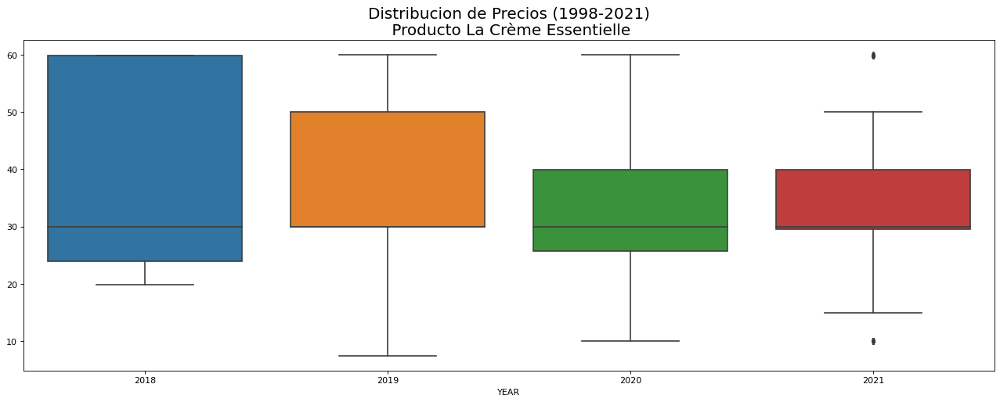

In [21]:
# Draw Plot
fig, axes = plt.subplots( figsize=(20,7), dpi= 80)
sns.boxplot(x='YEAR', y=df_1.PVP.values, data=df_1)

# Set Title
axes.set_title('Distribucion de Precios (1998-2021)\n Producto La Crème Essentielle', fontsize=18); 
plt.show();

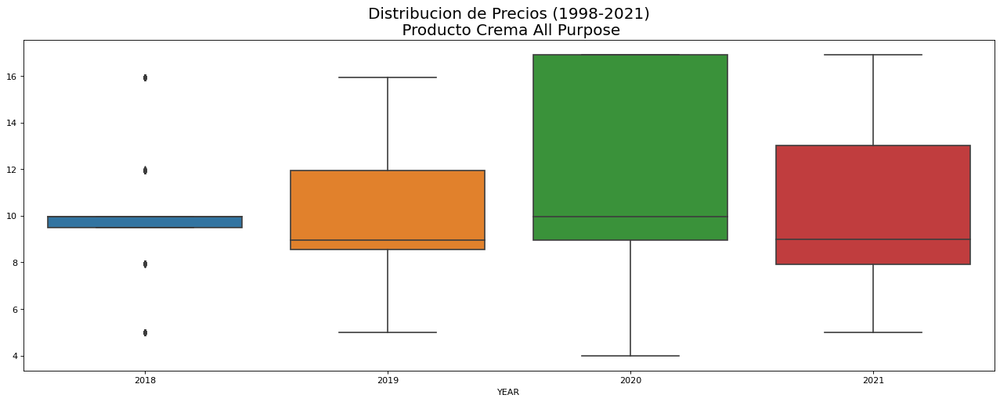

In [19]:
# Draw Plot
fig, axes = plt.subplots( figsize=(20,7), dpi= 80)
sns.boxplot(x='YEAR', y=df_2.PVP.values, data=df_2)

# Set Title
axes.set_title('Distribucion de Precios (1998-2021)\n Producto Crema All Purpose', fontsize=18); 
plt.show();

interval columns not set, guessing: ['REGION_ID', 'CICLO', 'YEAR', 'MONTH', 'ID_STANHOME', '%DTO.', 'PAGINA', 'COD-MOV.', 'SEGMENTO_ID', 'PVP', 'PVP_TOT_FACTURA', 'PROMO_ID']


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/phik/data_quality.py:74: UserWarning: Not enough unique value for variable MONTH for analysis 1. Dropping this column
  col, df[col].nunique()
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/phik/data_quality.py:74: UserWarning: Not enough unique value for variable SEGMENTO_ID for analysis 1. Dropping this column
  col, df[col].nunique()
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/phik/data_quality.py:84: UserWarning: Not enough unique value for variable DATE for analysis 1. Dropping this column
  col, df[col].nunique()


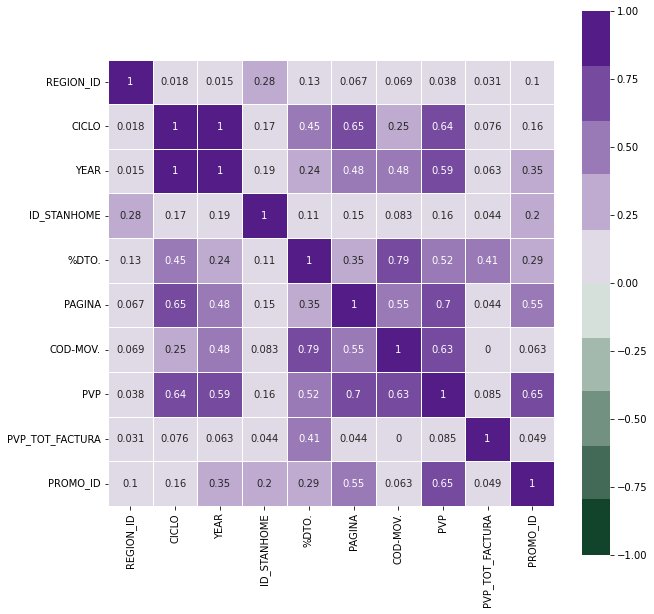

In [22]:
# Esta matriz es un muy buen indicador sobre la relación entre los datos, teniendo en cuenta variables categóricas.
phik_matrix = df_1.phik_matrix()

plt.figure(figsize=(10,10))
sns.heatmap(phik_matrix,
            vmin=-1,
            vmax=1,
            center=0,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=10),
            square=True,
            annot=True,
            linewidths=.5);

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


<Figure size 1080x720 with 0 Axes>

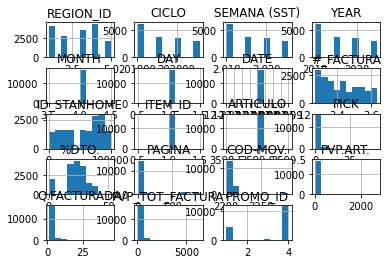

In [13]:
plt.figure(figsize=(15,10))
df_1.drop(['PVP'], 1).hist()
plt.show()

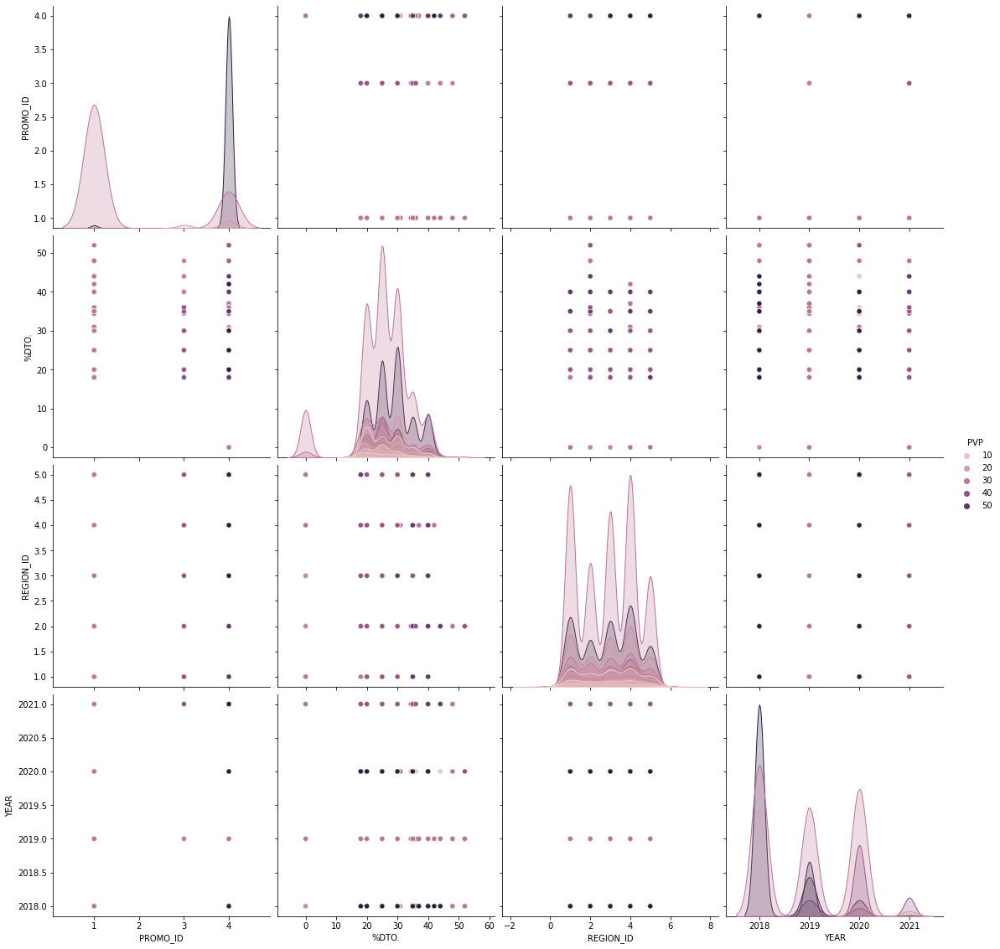

In [16]:
sns.pairplot(df_1.dropna(),
            hue='PVP',
            height=4,
            vars=["PROMO_ID","%DTO.","REGION_ID", "YEAR"],
            kind='scatter');

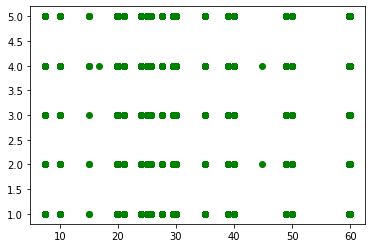

In [17]:
plt.scatter(df_1['PVP'], df_1['REGION_ID'], color = 'green')

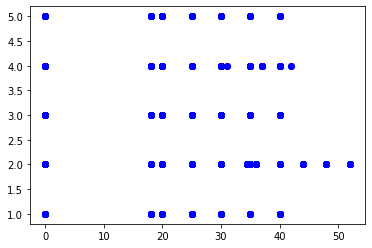

In [18]:
plt.scatter(df_1['%DTO.'], df_1['REGION_ID'], color = 'blue')

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit

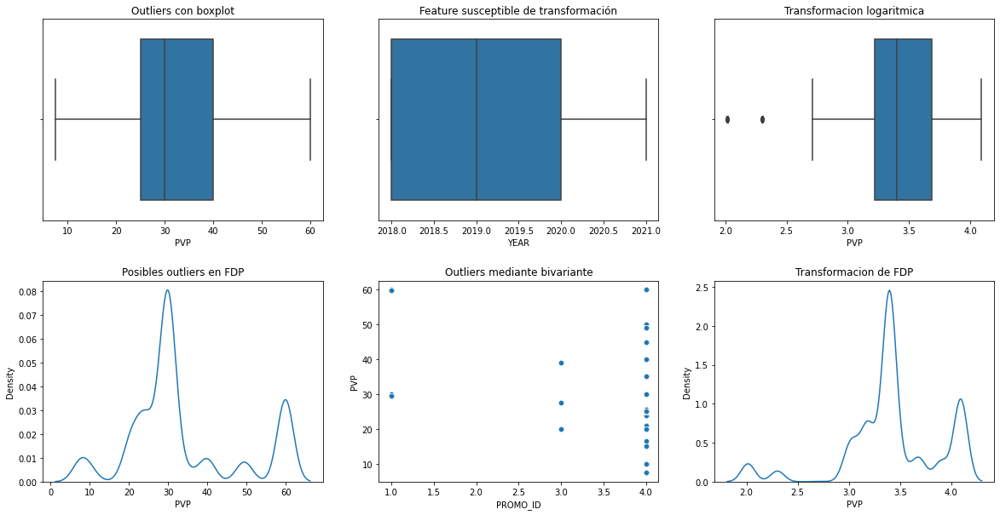

In [21]:
# Target de precio en el dataset 
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
plt.subplots_adjust(hspace = 0.3)

# Outliers con boxplot
sns.boxplot(df_1['PVP'], ax=axes[0, 0])
axes[0, 0].set_title("Outliers con boxplot")

# Feature susceptible de transformación
sns.boxplot(df_1['YEAR'], ax=axes[0, 1])
axes[0, 1].set_title("Feature susceptible de transformación")

# Transformacion logaritmica
sns.boxplot(np.log(df_1['PVP']), ax=axes[0, 2])
axes[0, 2].set_title("Transformacion logaritmica")

# Posibles outliers mediante FDP
sns.kdeplot(df_1['PVP'], ax=axes[1, 0])
axes[1, 0].set_title("Posibles outliers en FDP")

# Outliers mediante bivariante
sns.scatterplot(data=df_1, x='PROMO_ID', y='PVP', ax=axes[1, 1])
axes[1, 1].set_title("Outliers mediante bivariante")

# Transformacion de FDP
sns.kdeplot(np.log(df_1["PVP"]), ax=axes[1, 2])
axes[1, 2].set_title("Transformacion de FDP");

Len original: 16582
Len sin outliers en depth: 16582


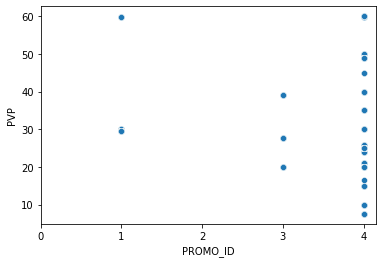

In [39]:
out_df1 = outliers_quantie(df_1, 'PROMO_ID', 7)
print("Len original:", len(df_1))
print("Len sin outliers en depth:", len(out_df1))
sns.scatterplot(data=out_df1, x='PROMO_ID', y='PVP')
plt.xticks([0, 1, 2, 3, 4]);

Len original: 24211
Len sin outliers en depth: 24013


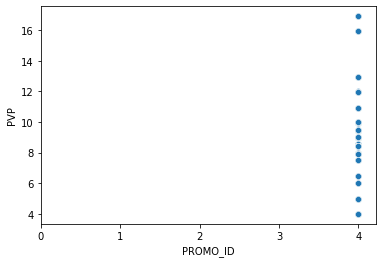

In [37]:
out_df2 = outliers_quantie(df_2, 'PROMO_ID', 7)
print("Len original:", len(df_2))
print("Len sin outliers en depth:", len(out_df2))
sns.scatterplot(data=out_df2, x='PROMO_ID', y='PVP')
plt.xticks([0, 1, 2, 3, 4]);

In [23]:
# Muy por debajo del nivel de significación (0.05) no se considera distribución normal.
print("Saphiro:", shapiro(df_1["PVP"]).pvalue)

# Para comprobar la asimetría de una variable siempre podemos calcular su valor skew
# 0 si es simetrica, >0 cola hacia la derecha, <0 cola hacia la izquierda
print("Asimetria:", skew(df_1["PVP"]))

Saphiro: 0.0
Asimetria: 0.6546990301233198


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


p-value Shapiro test Original:  0.0
Asimetria: 0.6546990301233198
p-value Shapiro test Logaritmic:  0.0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Asimetria: -0.8335260669772041
p-value Shapiro test Box-cox:  0.0
Asimetria: 0.017023193973650957


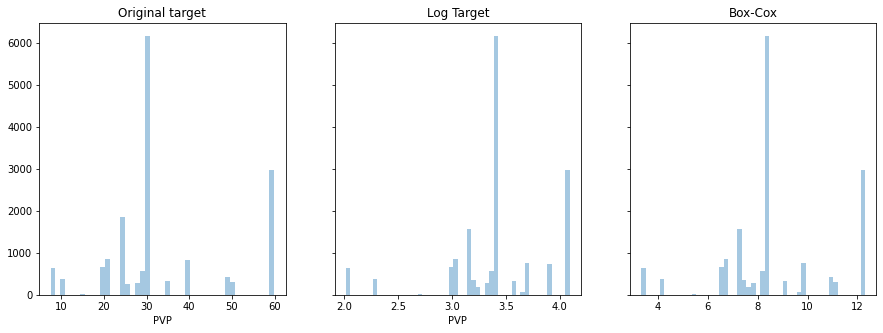

In [24]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Original target
print("p-value Shapiro test Original: ", shapiro(df_1["PVP"]).pvalue)
sns.distplot(df_1["PVP"], kde=False, ax=axes[0])
axes[0].set_title("Original target")
print("Asimetria:", skew(df_1["PVP"]))

# Logaritmic
print("p-value Shapiro test Logaritmic: ", shapiro(np.log(df_1["PVP"]),).pvalue)
sns.distplot(np.log(df_1["PVP"]),kde=False, ax=axes[1])
#axes[1].set_title("Log" + '\np-value Shapiro ' + str(shapiro_test))
axes[1].set_title("Log Target")
print("Asimetria:", skew(np.log(df_1["PVP"])))

# Box-cox
print("p-value Shapiro test Box-cox: ", shapiro(stats.boxcox(df_1["PVP"])[0]).pvalue)
sns.distplot(stats.boxcox(df_1["PVP"])[0],kde=False, ax=axes[2])
axes[2].set_title("Box-Cox");
print("Asimetria:", skew(stats.boxcox(df_1["PVP"])[0]))